# Social Network Analysis Assignment

**Author: Panagiotis Anastasiadis**

Analysis on the dataset "A song of Ice and Fire" from http://konect.cc/networks/asoiaf.

Data source (https://github.com/mathbeveridge/asoiaf)

*"This is the fictional social network of the series of fantasy novels "A Song of Ice and Fire" by George R. R. Martin (1996–present). An edge denotes that two characters are mentioned within fifteen words of each other; edge multiplicities denote the number of such appearances. This version of the dataset covers books one to five."*

## Initialization

Import the necessary libraries.

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from math import sqrt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from networkx.classes.graph import Graph
import pandas as pd
import seaborn as sns

Download and specify the dataset file paths (character names and edges) accordingly.

* Edges CSV online source: https://github.com/mathbeveridge/asoiaf/blob/master/data/asoiaf-all-edges.csv
* Characters CSV online source: https://github.com/mathbeveridge/asoiaf/blob/master/data/asoiaf-all-nodes.csv

In [2]:
interactions_file_path = '<path-to-file-asoiaf-all-edges.csv>'
characters_file_path = ('<path-to-file-asoiaf-all-nodes.csv>')

Import the dataset files as DataFrames. Drop unecessary columns.  

In [3]:
dataset_df=pd.read_csv(interactions_file_path,header=0,names=['Source', 'Target', 'Type', 'Id', 'Weight'])
dataset_names=pd.read_csv(characters_file_path)
dataset_df = dataset_df.drop(['Type'], axis=1)
dataset_df = dataset_df.drop(['Id'], axis=1)

Add 2 indexing columns (SourceId, TargetId) alongside the 'Source' and 'Target' names on the edges dataframe.

In [4]:
id_mapping = dict(zip(dataset_names['Id'], dataset_names['Label'].index))

# add integer ids to characters-nodes
dataset_names['Id'] = dataset_names['Id'].replace(id_mapping)

# add integer values to src and target for the edges
dataset_df['SourceId'] = dataset_df['Source'].map(id_mapping)
dataset_df['TargetId'] = dataset_df['Target'].map(id_mapping)

dataset_names.to_csv('characters.csv', index=False)
dataset_df.to_csv('interactions.csv', index=False)


Create a graph from the edges DataFrame.

In [5]:
G=nx.from_pandas_edgelist(dataset_df,source='SourceId',target='TargetId', edge_attr='Weight')
print('Number of vertices: {}'.format(G.number_of_nodes()))
print('Number of edges: {}'.format(G.number_of_edges()))

Number of vertices: 796
Number of edges: 2823


Draw the graph.

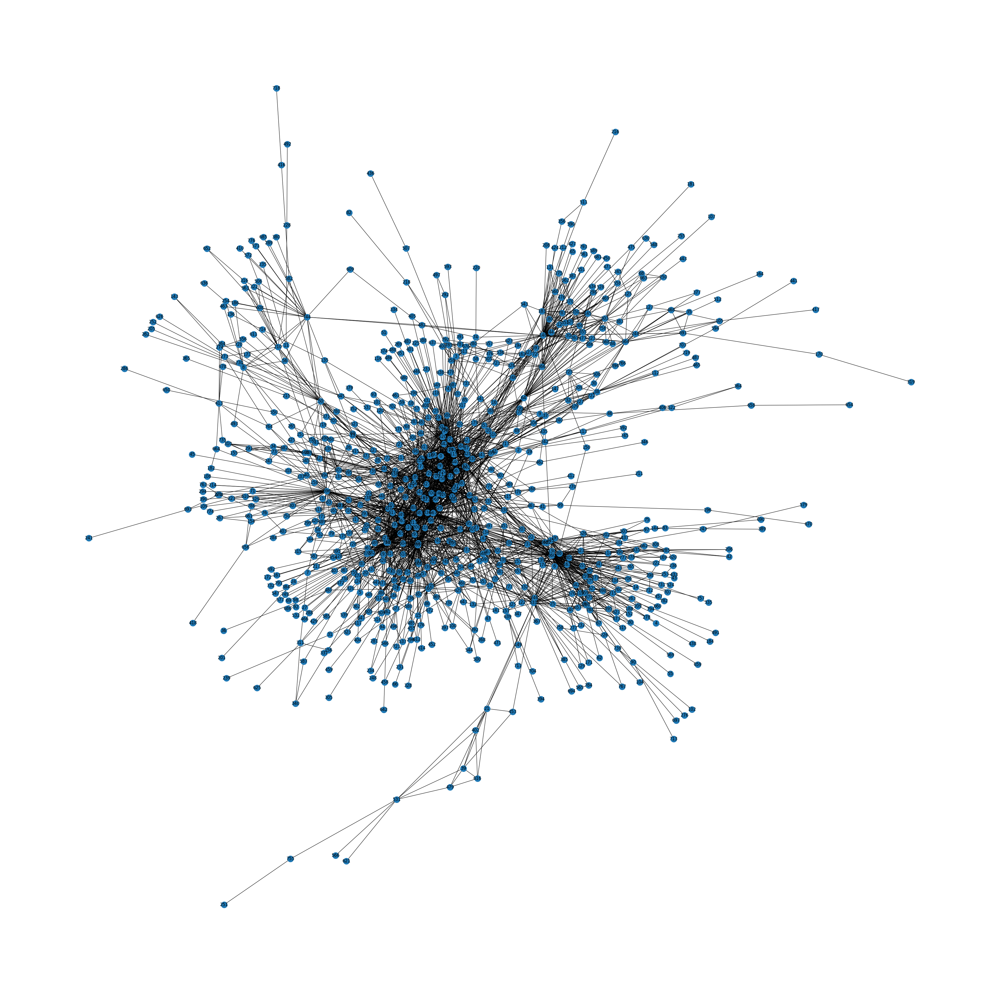

In [6]:
plt.figure(figsize=(50,50))
spund=nx.spring_layout(G)
plt.axis('off')
nx.draw_networkx(G,pos=spund)
plt.show()

## Stage 1: Creating a synthetic social network with similar characteristics to a real network and calculating graph metrics for both networks.

### Degree Distribution

We observe significant connections reflecting key relationships from the book "A Song of Ice and Fire":

E.g. 
* Eddard Stark and Robert Baratheon, two of the protagonists, have the most interactions on the entire book series. 
* The partnership between Daenerys Targaryen and Jorah Mormont is also notable.



In [7]:
df_sorted = dataset_df.sort_values(by='Weight', ascending=False)
df_sorted.head(10)

,Source,Target,Weight,SourceId,TargetId
1334,Eddard-Stark,Robert-Baratheon,334,189,602
2031,Jon-Snow,Samwell-Tarly,228,360,631
1965,Joffrey-Baratheon,Sansa-Stark,222,354,633
1972,Joffrey-Baratheon,Tyrion-Lannister,219,354,726
640,Bran-Stark,Hodor,209,89,306
946,Cersei-Lannister,Tyrion-Lannister,209,115,726
1901,Jeor-Mormont,Jon-Snow,174,345,360
897,Cersei-Lannister,Joffrey-Baratheon,173,115,354
665,Bran-Stark,Robb-Stark,169,89,600
1099,Daenerys-Targaryen,Jorah-Mormont,161,148,366


Calculate node degrees (both weighted and not weighted) and add the corresponding ids, names and degree values from the dataset to the nodes of the graph.


In [19]:
# Add the corresponding ids and names to nodes
labels=dataset_names.to_dict()
nx.set_node_attributes(G, labels)

degrees = dict(nx.degree(G))
weighted_degrees = dict(nx.degree(G,weight='Weight'))

# Add node degrees as attributes
nx.set_node_attributes(G,name='Degree',values=degrees)
nx.set_node_attributes(G,name='Weighted-Degree',values=weighted_degrees)

Sort the node degrees and create a DataFrame with labels and degrees, and finally display the top rows. We can see that the key-characters from the books have the most connections.

In [22]:
degreeslist=sorted(((value,key) for (key,value) in degrees.items()),reverse=True)
sortdegrees=dict([(k,v) for v,k in degreeslist])

df = dataset_names.loc[sortdegrees.keys(), ['Label']]

df['Degree'] = [sortdegrees[label] for label in df.index]
df.head(10)

,Label,Degree
726,Tyrion Lannister,122
360,Jon Snow,114
336,Jaime Lannister,101
115,Cersei Lannister,97
667,Stannis Baratheon,89
48,Arya Stark,84
633,Sansa Stark,75
110,Catelyn Stark,75
600,Robb Stark,74
189,Eddard Stark,74


Display sorted weighted degrees. The top-10 list reveals the key characters based on their frequency, taking into account the number of interactions between each pair of characters.

In [24]:
weighted_degrees_list=sorted(((value,key) for (key,value) in weighted_degrees.items()),reverse=True)
sor_w_degrees=dict([(k,v) for v,k in weighted_degrees_list])

df = dataset_names.loc[sor_w_degrees.keys(), ['Label']]

df['Weighted-Degree'] = [sor_w_degrees[label] for label in df.index]
df.head(10)

,Label,Weighted-Degree
726,Tyrion Lannister,2873
360,Jon Snow,2757
115,Cersei Lannister,2232
354,Joffrey Baratheon,1762
189,Eddard Stark,1649
148,Daenerys Targaryen,1608
336,Jaime Lannister,1569
633,Sansa Stark,1547
89,Bran Stark,1508
602,Robert Baratheon,1488


* The "get_avg_degree" function calculates the degree of a given graph.

* The "get_variance_and_sd" function computes the variance and standard deviation of node degrees in a graph.

In [27]:
def get_avg_degree(graph, haveWeights=False):
    if haveWeights:
        node_degree = dict(nx.degree(graph, weight='Weight'))
    else:
        node_degree = dict(nx.degree(graph))

    sum = 0
    for degree in node_degree.values():
        sum += degree
    return sum / nx.number_of_nodes(graph)

def get_variance_and_sd(graph, avg_degree):
    node_degree = dict(nx.degree(graph))
    sum = 0
    for degree in node_degree.values():
        sum += pow(degree - avg_degree, 2)
    variance_degree = sum / (nx.number_of_nodes(graph) - 1)
    standdev_degree = sqrt(variance_degree)
    return {'Variance': variance_degree, 'Standard Deviation': standdev_degree}

Calculate average degree, variance and standard deviation for our graph.

In [28]:
print('Average Degree', get_avg_degree(G))
print(get_variance_and_sd(G, get_avg_degree(G)))

Average Degree 7.092964824120603
{'Variance': 160.8995227710904, 'Standard Deviation': 12.684617565030898}


Now considering the weights, calculate, again, average degree, variance and standard deviation.

In [29]:
print('Average Degree', get_avg_degree(G, haveWeights=True))
print(get_variance_and_sd(G, get_avg_degree(G, haveWeights=True)))

Average Degree 81.98241206030151
{'Variance': 5776.383458171337, 'Standard Deviation': 76.00252270925839}


Calculate degree distribution.

In [39]:
vertices = G.nodes
degrees = [G.degree[x] for x in G.nodes]

df = pd.DataFrame(list(zip(vertices, degrees)), 
                  columns =['vertex', 'degree']) 

pd.crosstab(index=df['degree'], columns='count',normalize=False)

col_0,count
degree,
1,187
2,146
3,86
4,69
5,56
6,39
7,25
8,24
9,27


Plot the degree distribution.

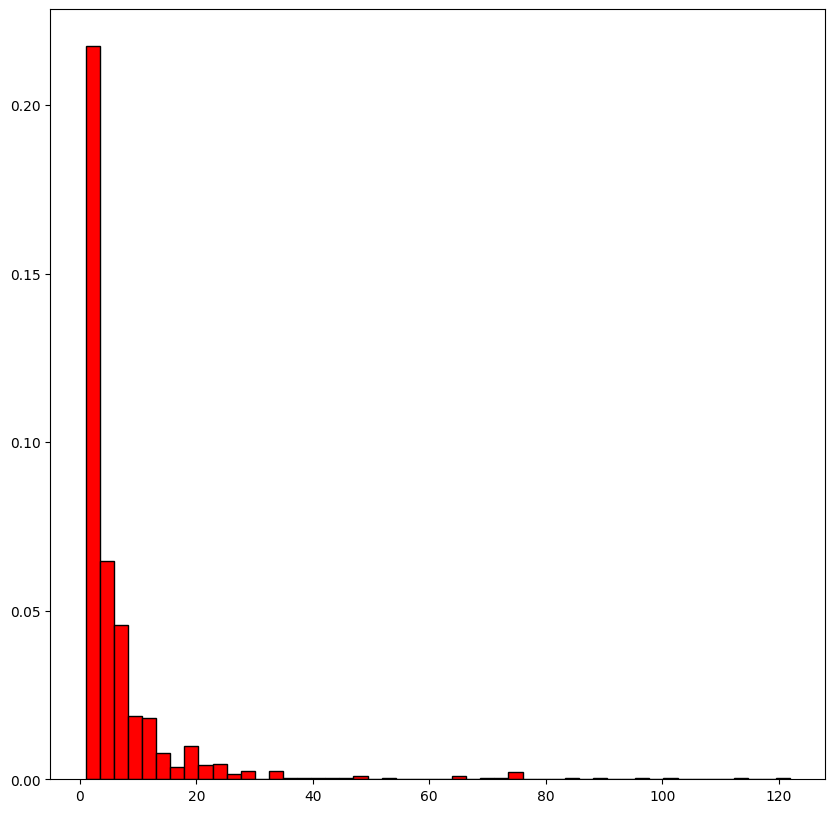

In [40]:
plt.figure(figsize=(10,10))
n, bins, patch = plt.hist(df['degree'], color = 'red',bins=50, edgecolor = 'black',density=True)
plt.show()

<Axes: xlabel='degree', ylabel='Density'>

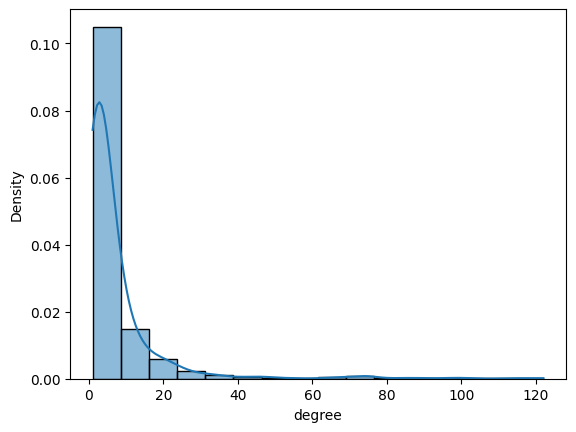

In [16]:
sns.histplot(df['degree'],bins=16,kde=True,stat='density')

Calculate weighted-degree distribution.

In [45]:
vertices = G.nodes
w_degrees = dict(nx.degree(G, weight='Weight'))

df = pd.DataFrame(list(zip(vertices, w_degrees.values())), 
                  columns =['vertex', 'w_degree']) 

pd.crosstab(index=df['w_degree'], columns='count',normalize=False)

col_0,count
w_degree,
3,100
4,43
5,16
6,41
7,41
...,...
1649,1
1762,1
2232,1


Plot weighted-degree distribution.

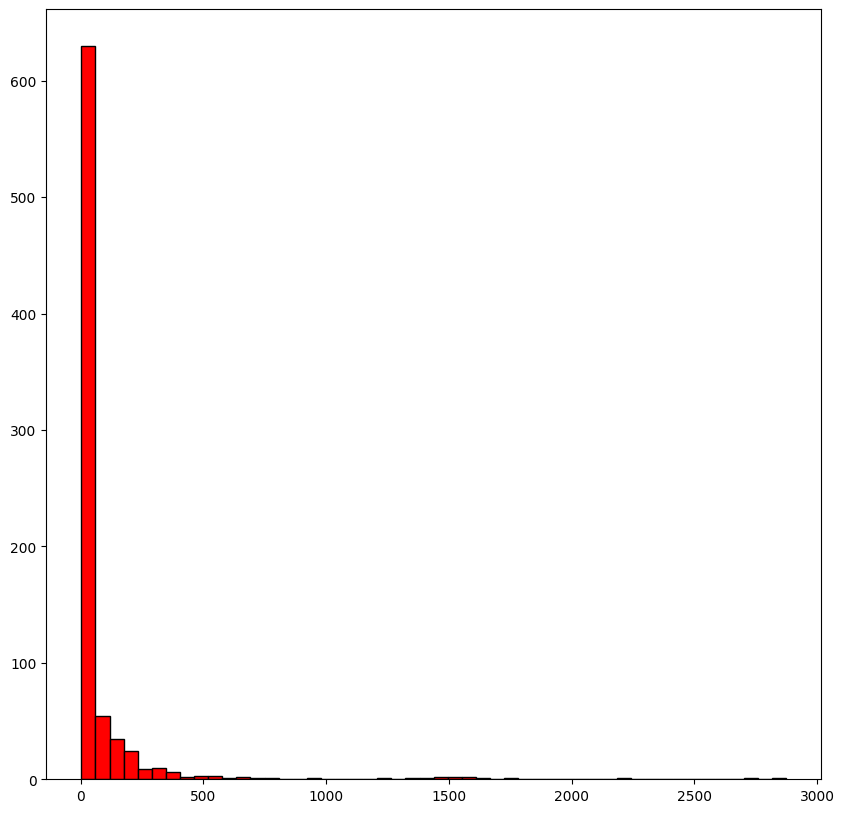

In [47]:
plt.figure(figsize=(10,10))
n, bins, patch = plt.hist(df['w_degree'], color = 'red',bins=50, edgecolor = 'black')
plt.show()

### Connectivity

Is this network connected?

In [48]:
print(nx.is_connected(G))

True


### Centralities


The "calculate_centrality" function calculates centrality measures based on the provided input. It determines the appropriate centrality measure based on the input string, computes the centrality values for the graph, and returns a DataFrame with the top 20 nodes ranked by centrality along with their respective indices and centrality values.

In [18]:
def calculate_centrality(centrality):
    if (centrality == 'degree_centrality'):
        calc_centrality = nx.degree_centrality(G)
    elif (centrality == 'weighted_degree_centrality'):
        calc_centrality = dict(nx.degree(G,weight='Weight'))
    elif (centrality == 'betweeness_centrality'):
        calc_centrality = nx.betweenness_centrality(G)
    elif (centrality == 'closeness_centrality'):
        calc_centrality = nx.closeness_centrality(G)
    elif (centrality == 'eigenvector_centrality'):
        calc_centrality =  nx.eigenvector_centrality(G, weight=None)
    elif (centrality == 'weighted_eigenvector_centrality'):
        calc_centrality =  nx.eigenvector_centrality(G, weight='Weight')
    else:
        return

    sorted_cc = dict(sorted(calc_centrality.items(), key=lambda item: item[1], reverse = True))
    df = dataset_names.loc[sorted_cc.keys(), ['Label']]
    df['Index'] = [i + 1 for i, _ in enumerate(df.index)]
    df['Centrality'] = [sorted_cc[label] for label in df.index]
    return df.head(20)

Calculate degree centrality. Key characters are at the top list as expected.

In [19]:
print('Degree Centrality')
calculate_centrality('degree_centrality')

Degree Centrality


,Label,Index,Centrality
726,Tyrion Lannister,1,0.153459
360,Jon Snow,2,0.143396
336,Jaime Lannister,3,0.127044
115,Cersei Lannister,4,0.122013
667,Stannis Baratheon,5,0.111950
48,Arya Stark,6,0.105660
110,Catelyn Stark,7,0.094340
633,Sansa Stark,8,0.094340
600,Robb Stark,9,0.093082
189,Eddard Stark,10,0.093082


Calculate weighted degree centrality. 

Commenting some of the results.

* Daenerys Targaryen's centrality is higher compared to her degree centrality. This is due to her storyline being relatively isolated (that explains low degree centrality), but she still remains a protagonist and a key character in the books.

In [20]:
print('Weighted Degree Centrality')
calculate_centrality('weighted_degree_centrality')

Weighted Degree Centrality


,Label,Index,Centrality
726,Tyrion Lannister,1,2873
360,Jon Snow,2,2757
115,Cersei Lannister,3,2232
354,Joffrey Baratheon,4,1762
189,Eddard Stark,5,1649
148,Daenerys Targaryen,6,1608
336,Jaime Lannister,7,1569
633,Sansa Stark,8,1547
89,Bran Stark,9,1508
602,Robert Baratheon,10,1488


Calculate closeness centrality. Measuring how close a character is to other characters in terms of shortest path distances. 
* Characters like the Lannisters hold top positions due to their extensive involvement in multiple storylines.
* However, Daenerys, with her isolated storyline, isn't as closely connected to the other storylines, which explains her absence from the top 20 list.

In [21]:
print('Closeness Centrality')
calculate_centrality('closeness_centrality')

Closeness Centrality


,Label,Index,Centrality
726,Tyrion Lannister,1,0.476333
602,Robert Baratheon,2,0.459272
189,Eddard Stark,3,0.455849
115,Cersei Lannister,4,0.454545
336,Jaime Lannister,5,0.451961
360,Jon Snow,6,0.445378
667,Stannis Baratheon,7,0.444631
600,Robb Stark,8,0.444134
354,Joffrey Baratheon,9,0.433952
110,Catelyn Stark,10,0.433479


Calculate betweeness centrality. This centrality looks at the number of shortest paths that pass through a node, indicating its influence in facilitating communication and interaction between different parts of the network.

* Due to the same reasons mentioned earlier, Daenerys holds a high betweenness centrality, ranking in the top-3. This is because she plays a crucial role in connecting the characters from her storyline to the central storylines.

In [22]:
print('Betweeness Centrality')
calculate_centrality('betweeness_centrality')

Betweeness Centrality


,Label,Index,Centrality
360,Jon Snow,1,0.192120
726,Tyrion Lannister,2,0.162191
148,Daenerys Targaryen,3,0.118418
696,Theon Greyjoy,4,0.111283
667,Stannis Baratheon,5,0.110140
336,Jaime Lannister,6,0.100838
115,Cersei Lannister,7,0.088704
48,Arya Stark,8,0.087242
189,Eddard Stark,9,0.078732
602,Robert Baratheon,10,0.078228



Calculate the eigenvector centrality, which considers the number of connections a node has and the importance of those connections.

* The Lannisters and then the Starks take the top positions in eigenvector centrality. This is because they play important roles in the plot and have interactions with the most significant characters in the books, making them influential within the network.

In [23]:
print('Eigenvector Centrality')
calculate_centrality('eigenvector_centrality')

Eigenvector Centrality


,Label,Index,Centrality
726,Tyrion Lannister,1,0.251558
115,Cersei Lannister,2,0.235771
336,Jaime Lannister,3,0.226339
354,Joffrey Baratheon,4,0.214376
633,Sansa Stark,5,0.205842
602,Robert Baratheon,6,0.194375
189,Eddard Stark,7,0.191660
667,Stannis Baratheon,8,0.182085
110,Catelyn Stark,9,0.175886
600,Robb Stark,10,0.173196


Calculate the eigenvector centrality, taking into account the weights of connections.

The overall results are similar to the previous analysis. 
* One noteworthy observation is that, Jamie Lannister loses some positions in the top list. While he does interact with important characters, it happens less frequently compared to other characters in the top list, leading to a slightly lower eigenvector centrality score for him.

In [24]:
print('Weighted Eigenvector Centrality')
calculate_centrality('weighted_eigenvector_centrality')

Weighted Eigenvector Centrality


,Label,Index,Centrality
726,Tyrion Lannister,1,0.380513
115,Cersei Lannister,2,0.358738
354,Joffrey Baratheon,3,0.342992
602,Robert Baratheon,4,0.282698
189,Eddard Stark,5,0.281761
633,Sansa Stark,6,0.274295
336,Jaime Lannister,7,0.214824
600,Robb Stark,8,0.173990
360,Jon Snow,9,0.169060
110,Catelyn Stark,10,0.164060


Calculate betweenness centrality for edges. Also, sort the results.

In [50]:
edge_betweenness_centr=nx.edge_betweenness_centrality(G, weight='Weight')

sorted_edge_c = dict(sorted(edge_betweenness_centr.items(), key=lambda item: item[1], reverse = True))
print(sorted_edge_c)

{(336, 360): 0.045824476249952645, (726, 696): 0.03447361481826259, (696, 744): 0.034119756122221276, (115, 148): 0.03118469980658279, (729, 696): 0.025225736622342322, (696, 368): 0.024492600473211095, (602, 50): 0.02333137058959569, (602, 183): 0.022646618838426932, (360, 368): 0.022382712101589517, (726, 64): 0.01943964059636768, (336, 510): 0.018739118031096815, (600, 631): 0.017832538157038003, (148, 428): 0.017747429871730634, (360, 607): 0.01696228357885703, (631, 402): 0.016517186657510934, (115, 77): 0.016420425158454956, (667, 368): 0.016302370290708208, (602, 95): 0.016280007404497754, (602, 178): 0.01575785383669143, (148, 178): 0.014474876606525418, (345, 366): 0.014078294286647383, (48, 607): 0.014032159262556528, (729, 3): 0.014024133846832246, (148, 189): 0.01377033415053705, (729, 95): 0.012716365846402808, (602, 499): 0.012640044587517784, (338, 633): 0.012533090958709624, (667, 88): 0.012118525391256971, (360, 525): 0.011768489684484752, (510, 38): 0.0117434908394422

Print the top-5 results.

In [51]:
# Print top-5 results
print(dataset_names.loc[[336, 360]])
print(dataset_names.loc[[726, 696]])
print(dataset_names.loc[[696, 744]])
print(dataset_names.loc[[115, 148]])
print(dataset_names.loc[[729, 696]])

      Id            Label
336  336  Jaime Lannister
360  360         Jon Snow
      Id             Label
726  726  Tyrion Lannister
696  696     Theon Greyjoy
      Id              Label
696  696      Theon Greyjoy
744  744  Victarion Greyjoy
      Id               Label
115  115    Cersei Lannister
148  148  Daenerys Targaryen
      Id            Label
729  729  Tywin Lannister
696  696    Theon Greyjoy


### Eccentricity

**Radius**: It represents the shortest path distance between the two most distant nodes in the network.

**Diameter**: It measures how far a particular node is from the farthest node in the network.

Considering the relatively large number of edges in the graph (2823), the values of radius and diameter indicate that the network is generally tightly connected.

In [52]:
print(nx.radius(G, weight='Weight'))
print(nx.diameter(G, weight='Weight'))

29
53


Create a function to calculate the eccentricity of nodes in the graph, sort them in ascending or descending order, and return the top 20 nodes with their corresponding labels and eccentricity values.

In [54]:
def calculate_eccentricity(asc=True):
    eccent=nx.eccentricity(G, weight='Weight')

    if (asc == False):
        sorted_ec = dict(sorted(eccent.items(), key=lambda item: item[1], reverse=True))
    else:
        sorted_ec = dict(sorted(eccent.items(), key=lambda item: item[1]))

    df = dataset_names.loc[sorted_ec.keys(), ['Label']]
    df['Index'] = [i + 1 for i, _ in enumerate(df.index)]
    df['Eccentricity'] = [sorted_ec[label] for label in df.index]
    return df.head(20)

In [55]:
calculate_eccentricity(True)

,Label,Index,Eccentricity
600,Robb Stark,1,29
88,Bowen Marsh,2,30
163,Denys Mallister,3,30
338,Janos Slynt,4,30
360,Jon Snow,5,30
439,Mance Rayder,6,30
602,Robert Baratheon,7,30
631,Samwell Tarly,8,30
464,Melisandre,9,30
742,Varys,10,31


In [56]:
calculate_eccentricity(False)

,Label,Index,Eccentricity
749,Waif,1,53
251,Gormon Tyrell,2,53
483,Mord,3,52
384,Kindly Man,4,50
755,Walgrave,5,50
380,Kerwin,6,50
621,Rosey,7,49
685,Talbert Serry,8,48
252,Gormond Goodbrother,9,47
173,Dolf,10,47


### Cliques

Function to get the sorted list of cliques in the graph, with cliques organized in descending order based on their size.

In [57]:
def get_sorted_cliques(graph):
    cliques = list(nx.find_cliques(graph))
    cliques.sort(key=len, reverse=True)
    return cliques

Find the cliques in the network and display the total number of cliques found.

In [59]:
sorted_cliques = get_sorted_cliques(G)
print('Number of cliques:', len(sorted_cliques))

Number of cliques: 1166


Display the longest clique in the network along with the characters it comprises.

* It's interesting to observe that the major characters belong to the largest clique, which primarily includes the Lannisters, the Starks, and a few "spy" characters like Baelish and Varys.

In [63]:
print('Number of nodes for the longest clique', len(sorted_cliques[0]))
df = dataset_names.loc[sorted_cliques[0], ['Label']]
df['Index'] = [i + 1 for i, _ in enumerate(df.index)]
df

Number of nodes for the longest clique 14


,Label,Index
726,Tyrion Lannister,1
115,Cersei Lannister,2
354,Joffrey Baratheon,3
633,Sansa Stark,4
336,Jaime Lannister,5
602,Robert Baratheon,6
189,Eddard Stark,7
538,Petyr Baelish,8
584,Renly Baratheon,9
742,Varys,10


Show the second longest clique in the network, which is primarily composed of characters associated with Arya Stark's storyline and adventures.

In [65]:
print('Number of nodes for the second longest clique', len(sorted_cliques[1]))
df = dataset_names.loc[sorted_cliques[1], ['Label']]
df['Index'] = [i + 1 for i, _ in enumerate(df.index)]
df

Number of nodes for the second longest clique 13


,Label,Index
29,Amory Lorch,1
48,Arya Stark,2
354,Joffrey Baratheon,3
258,Gregor Clegane,4
115,Cersei Lannister,5
327,Ilyn Payne,6
472,Meryn Trant,7
568,Rafford,8
632,Sandor Clegane,9
185,Dunsen,10


### Other metrics

**Triangles**: Count the number of triangles in the graph, sort them in descending order by count, and display the top 20 nodes along with their labels and triangle counts.

In [32]:
triangles = nx.triangles(G)
print('Number of triangles:',len(triangles))
sorted_triangles = dict(sorted(triangles.items(), key=lambda item: item[1], reverse=True))

df = dataset_names.loc[sorted_triangles.keys(), ['Label']]
df['Index'] = [i + 1 for i, _ in enumerate(df.index)]
df['Triangle Count'] = [sorted_triangles[label] for label in df.index]
df.head(20)

Number of triangles: 796


,Label,Index,Triangle Count
726,Tyrion Lannister,1,659
115,Cersei Lannister,2,613
336,Jaime Lannister,3,548
354,Joffrey Baratheon,4,515
633,Sansa Stark,5,465
360,Jon Snow,6,427
602,Robert Baratheon,7,420
667,Stannis Baratheon,8,419
189,Eddard Stark,9,410
48,Arya Stark,10,392


**Minimum node cut:** Print the minimum node cut in the graph that, if removed from the graph, would separate it into disconnected parts.

In [66]:
print(nx.minimum_node_cut(G))
dataset_names.loc[3]

{3}


Id                                      3
Label    Aegon Targaryen (son of Rhaegar)
Name: 3, dtype: object

**Minimum edge cut:** Print the minimum edge cut in the graph that, if removed from the graph, would separate it into disconnected parts.


In [34]:
print(nx.minimum_edge_cut(G))
dataset_names.loc[[360, 794]]

{(360, 794)}


,Id,Label
360,360,Jon Snow
794,794,Zei


**Clustering coefficients:** 
Calculate the clustering coefficients for each node in the graph, print the coefficients, and create a DataFrame displaying the results.
This metric shows for a node, how closely its neighboring nodes are interconnected.

In [71]:
cl_coefficients = nx.clustering(G)
print(cl_coefficients)

sorted_clcs = dict(sorted(cl_coefficients.items(), key=lambda item: item[1], reverse=True))
df = dataset_names.loc[sorted_clcs.keys(), ['Label']]
df['Index'] = [i + 1 for i, _ in enumerate(df.index)]
df['CL-C'] = [sorted_clcs[label] for label in df.index]
df

{0: 0.5454545454545454, 101: 0.3684210526315789, 115: 0.13165807560137457, 272: 0.4117647058823529, 336: 0.10851485148514851, 337: 0.5, 354: 0.2195225916453538, 381: 0.5073529411764706, 422: 0.5, 510: 0.3368421052631579, 726: 0.08928329494648421, 729: 0.2712765957446808, 742: 0.36363636363636365, 1: 1.0, 110: 0.13837837837837838, 600: 0.14142910033320993, 671: 0.8, 751: 0.34502923976608185, 2: 0.2222222222222222, 148: 0.07648401826484018, 189: 0.15179563124768605, 290: 0.6666666666666666, 501: 0.5, 592: 1.0, 667: 0.10699693564862105, 717: 1.0, 745: 1.0, 3: 0.3333333333333333, 197: 0.5833333333333334, 218: 0.3333333333333333, 280: 0.45454545454545453, 292: 0.6666666666666666, 358: 0.31666666666666665, 400: 0.9523809523809523, 588: 0.35947712418300654, 593: 0, 613: 0.8214285714285714, 746: 0.4065934065934066, 785: 0.9523809523809523, 792: 1.0, 4: 0, 6: 0.27384615384615385, 5: 0, 21: 0.42857142857142855, 22: 0.5333333333333333, 88: 0.43137254901960786, 119: 0.7142857142857143, 130: 0.5714

,Label,Index,CL-C
1,Aegon Frey (son of Stevron),1,1.0
592,Rhaenys Targaryen,2,1.0
717,Torrhen Stark,3,1.0
745,Visenya Targaryen,4,1.0
792,Ysilla,5,1.0
...,...,...,...
685,Talbert Serry,792,0.0
774,Willow Witch eye,793,0.0
697,Thistle,794,0.0
704,Tion Frey,795,0.0


**Average clustering coefficient:** Calculate the extent to which nodes in the graph tend to form clusters or tightly interconnected groups.

In [72]:
print(nx.average_clustering(G))

0.48586220733504853


**Transitivity:** Calculate the transitivity, which is the ratio of the actual number of closed triangles to the total number of possible closed triangles in the graph.

In [37]:
print(nx.transitivity(G))

0.2090366938564282


**Density:**: Calculate the density of the network or in other words, the ratio of the existing edges in the graph to the total number of all possible edges that could exist.

In [38]:
print(nx.density(G))

0.008921968332227173


**Results**: The low density, the slight higher transitivity and the quite high value of average clustering imply that there are relatively fewer connections overall, but the existing connections tend to form clusters or groups. This suggests that the nature of the network, which consists mainly of interactions between characters, has pockets of tightly connected nodes, indicating the presence of distinct communities within the graph. These distinct communities represent the different storylines that take place in the book series.

### Random generated graph using Barabasi-Albert 

* We select the Barabasi-Albert method to generate a random graph that mimics the characteristics of our chosen book series network.

* By choosing Barabasi-Albert, we leverage its "rich-get-richer" feature, where a small number of nodes have a much larger number of connections compared to the rest.

* To enhance this process, we kick-start the Barabasi-Albert algorithm by using a subgraph from our real network as the initial network, ensuring that our generated graph aligns closely with the actual network structure.

Create a subgraph from the real network by using a Breadth-First Search (BFS) algorithm starting from a randomly chosen high-degree node to create a subgraph by including the visited nodes within a specified size limit.

In [87]:
import random

# Determine the threshold for high-degree nodes
degree_threshold = 30  # Adjust as needed

# Identify the high-degree nodes
high_degree_nodes = [node for node, degree in G.degree() if degree > degree_threshold]
# Choose a starting node for the BFS
starting_node = random.choice(high_degree_nodes)

# Perform the BFS
visited = set()
queue = [starting_node]
while queue:
    node = queue.pop(0)
    visited.add(node)
    neighbors = G.neighbors(node)
    for neighbor in neighbors:
        if neighbor not in visited and neighbor not in queue:
            queue.append(neighbor)

    # Stop the BFS at a specific depth or size
    # Adjust the stopping condition as needed
    if len(visited) >= 300:  # Adjust the size as needed
        break

# Create the subgraph
subgraph = G.subgraph(visited)


Plot the subgraph.

Graph with 300 nodes and 1569 edges


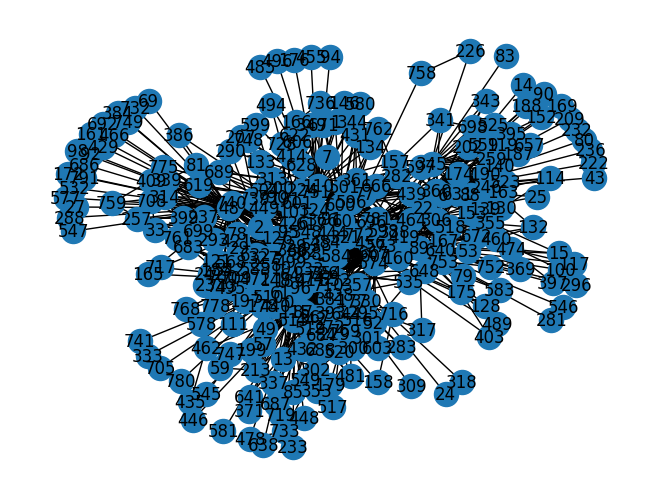

In [88]:
print(subgraph)
nx.draw(subgraph,with_labels=True)
plt.show()

Plot the subgraph degree distribution.

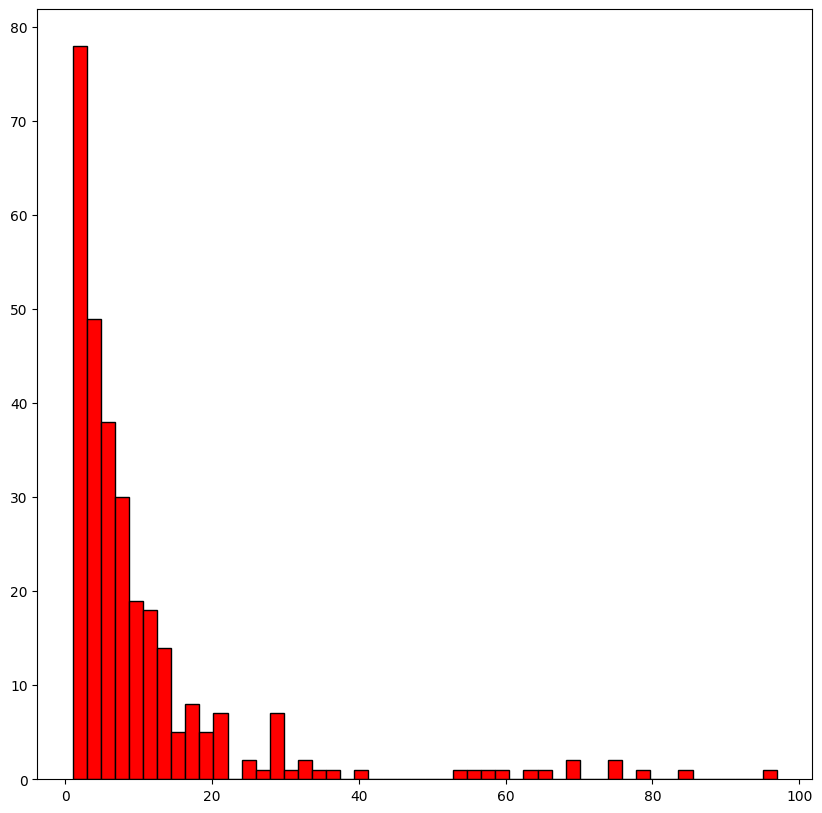

In [89]:
subg_degrees = [subgraph.degree[x] for x in subgraph.nodes]
plt.figure(figsize=(10,10))
n, bins, patch = plt.hist(subg_degrees, color = 'red',bins=50, edgecolor = 'black')
plt.show()

Generate thr Barabasi-Albert graph. 

In [90]:
barabasi_albert_graph=nx.generators.random_graphs.barabasi_albert_graph(n=985, m=2, initial_graph=subgraph)

for u, v in barabasi_albert_graph.edges():
    if barabasi_albert_graph.has_edge(u, v):
        if 'Weight' not in barabasi_albert_graph[u][v]:
            weight = random.randint(1, 20)
            barabasi_albert_graph[u][v]['Weight'] = weight


Plot the random generated network.

Graph with 801 nodes and 2900 edges


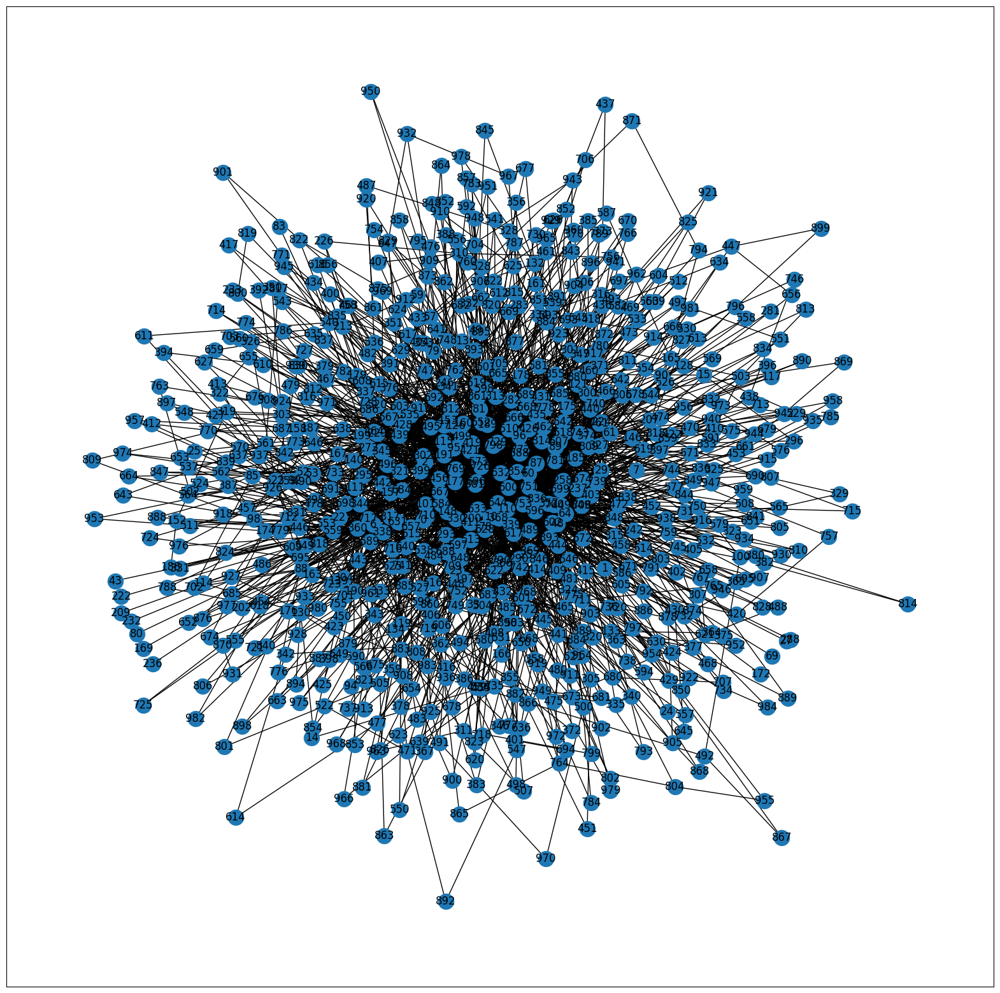

In [91]:
print(barabasi_albert_graph)
plt.figure(figsize=(20,20))
nx.draw_networkx(barabasi_albert_graph)
plt.show()

Calculate key metrics for the generated Barabasi-Albert graph.

This is a summary of the previously calculated key-metrics for the real network.
* Number of triangles: 796
* Number of cliques: 1166
* Radius: 29
* Diameter: 53
* Average Degree: 7.09
* Variance of Degree: 160.90
* Standard Deviation of Degree: 12.68
* Average Clustering Coefficient: 0.49
* Transitivity: 0.21
* Density: 0.009

In [86]:
print('(Is Connected?):', nx.is_connected(barabasi_albert_graph))
avg_degree = get_avg_degree(barabasi_albert_graph)
print('Average Degree:', avg_degree)
print(get_variance_and_sd(barabasi_albert_graph, avg_degree))
print('Transitivity:', nx.transitivity(barabasi_albert_graph))
print('Average Clustering:', nx.average_clustering(barabasi_albert_graph))
print('Density:', nx.density(barabasi_albert_graph))

print('Number of triangles:', len(nx.triangles(barabasi_albert_graph)))
ba_cliques = get_sorted_cliques(barabasi_albert_graph)
print('Number of cliques', len(ba_cliques))
print('Max-length clique:', ba_cliques[0], ', length:', len(ba_cliques[0]))

ba_sorted_ecc = dict(sorted(nx.eccentricity(barabasi_albert_graph, weight='Weight').items(), key=lambda item: item[1], reverse=True))
print('Eccentricities: ', ba_sorted_ecc)
print('Radius: ', nx.radius(barabasi_albert_graph, weight='Weight'))
print('Diameter: ', nx.diameter(barabasi_albert_graph, weight='Weight'))
print('Minimum node cut:', nx.minimum_node_cut(barabasi_albert_graph))
print('Minimum edge cut:', nx.minimum_edge_cut(barabasi_albert_graph))


(Is Connected?): True
Average Degree: 7.266497461928934
{'Variance': 183.77641109656196, 'Standard Deviation': 13.556415864695284}
Transitivity: 0.1593523505552231
Average Clustering: 0.2318915376493784
Density: 0.009233160688600932
Number of triangles: 788
Number of cliques 1708
Max-length clique: [336, 726, 115, 354, 633, 602, 189, 538, 584, 742, 729, 667, 600, 110] , length: 14
Eccentricities:  {731: 51, 932: 51, 899: 50, 929: 50, 962: 50, 856: 49, 860: 49, 959: 49, 308: 48, 420: 48, 625: 48, 626: 48, 639: 48, 651: 48, 759: 48, 849: 48, 877: 48, 328: 47, 479: 47, 498: 47, 770: 47, 809: 47, 818: 47, 821: 47, 854: 47, 343: 46, 397: 46, 548: 46, 629: 46, 659: 46, 673: 46, 690: 46, 749: 46, 831: 46, 851: 46, 886: 46, 492: 45, 612: 45, 703: 45, 841: 45, 878: 45, 915: 45, 304: 44, 392: 44, 527: 44, 556: 44, 624: 44, 634: 44, 656: 44, 658: 44, 698: 44, 813: 44, 842: 44, 844: 44, 846: 44, 847: 44, 882: 44, 897: 44, 913: 44, 927: 44, 955: 44, 968: 44, 319: 43, 332: 43, 425: 43, 438: 43, 452:

**Results:** We observe that the metrics of the real network and the generated Barabasi-Albert graph are very similar.

Calculate degree distribution.

In [45]:
vertices = barabasi_albert_graph.nodes
degrees = [barabasi_albert_graph.degree[x] for x in barabasi_albert_graph.nodes]
df_barabasi = pd.DataFrame(list(zip(vertices, degrees)), 
                  columns =['vertex', 'degree']) 

pd.crosstab(index=df_barabasi['degree'], columns='count',normalize=False)

col_0,count
degree,
1,9
2,411
3,97
4,43
5,22
6,25
7,13
8,13
9,13


Plot the degree distribution.

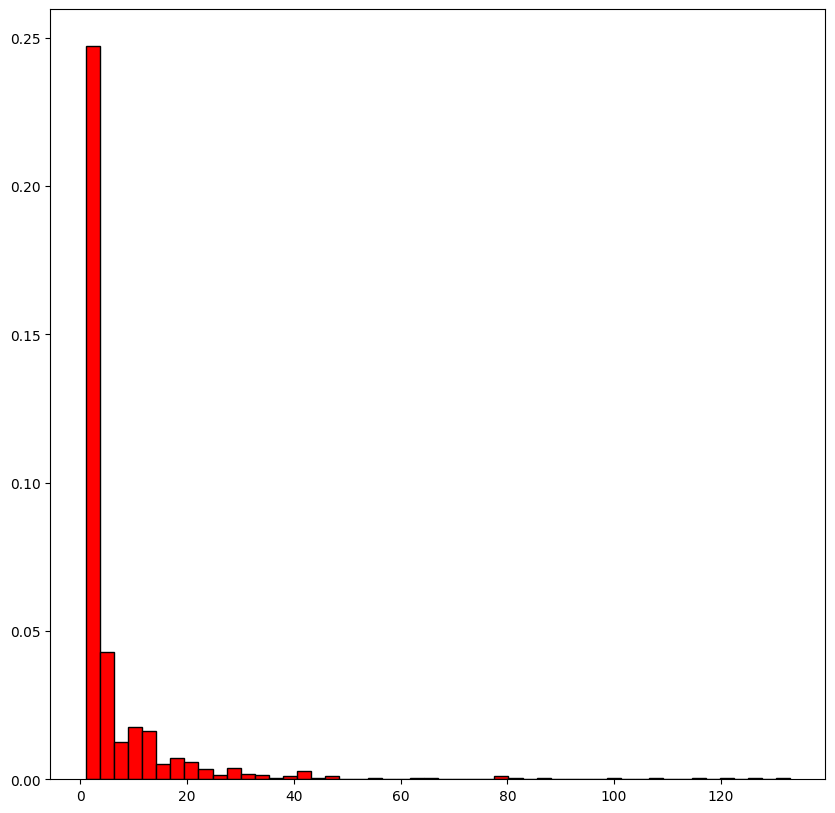

In [46]:
plt.figure(figsize=(10,10))
n, bins, patch = plt.hist(df_barabasi['degree'], color = 'red',bins=50, edgecolor = 'black',density=True)
plt.show()

Compute the centrality measures for the nodes in the Barabasi-Albert graph.

In [92]:
dg_centrality = nx.degree_centrality(barabasi_albert_graph)
wdg_centrality = dict(nx.degree(barabasi_albert_graph, weight='Weight'))
btn_centrality = nx.betweenness_centrality(barabasi_albert_graph)
cls_centrality = nx.closeness_centrality(barabasi_albert_graph)
eign_centrality = nx.eigenvector_centrality(barabasi_albert_graph, weight=None)
weign_centrality = nx.eigenvector_centrality(barabasi_albert_graph, weight='Weight')

print(
    'Degree centrality:',
    sorted(dg_centrality.items(), key=lambda item: item[1], reverse=True),
)
print(
    'Weighted Degree centrality:',
    sorted(wdg_centrality.items(), key=lambda item: item[1], reverse=True),
)
print(
    'Betweenness centrality:',
    sorted(btn_centrality.items(), key=lambda item: item[1], reverse=True),
)
print(
    'Closeness centrality:',
    sorted(cls_centrality.items(), key=lambda item: item[1], reverse=True),
)
print(
    'Eigenvector centrality:',
    sorted(eign_centrality.items(), key=lambda item: item[1], reverse=True),
)
print(
    'Weighted Eigenvector centrality:',
    sorted(weign_centrality.items(), key=lambda item: item[1], reverse=True),
)

Degree centrality: [(115, 0.1575), (189, 0.1325), (48, 0.13125), (110, 0.12875), (726, 0.1275), (336, 0.11625), (354, 0.11375), (360, 0.11375), (602, 0.10375000000000001), (89, 0.09875), (633, 0.09875), (667, 0.09375), (600, 0.0925), (538, 0.07375), (729, 0.07375), (710, 0.06), (696, 0.058750000000000004), (345, 0.0575), (632, 0.05625), (742, 0.05625), (631, 0.05375), (607, 0.05), (95, 0.04875), (584, 0.0475), (258, 0.04625), (426, 0.04625), (617, 0.045), (411, 0.045), (472, 0.0425), (519, 0.04125), (552, 0.04125), (327, 0.04125), (442, 0.04125), (428, 0.03875), (191, 0.0375), (790, 0.0375), (419, 0.0375), (598, 0.035), (338, 0.035), (64, 0.0325), (96, 0.0325), (368, 0.0325), (439, 0.0325), (499, 0.03125), (29, 0.03), (567, 0.03), (190, 0.03), (272, 0.03), (357, 0.03), (6, 0.02875), (751, 0.02875), (568, 0.0275), (237, 0.0275), (464, 0.0275), (510, 0.0275), (61, 0.02625), (348, 0.02625), (542, 0.025), (77, 0.025), (601, 0.025), (101, 0.025), (121, 0.025), (399, 0.025), (87, 0.025), (88

## Stage 2: Implementing a link prediction algorithm (Adamic Adar) on both the synthetic and real networks, evaluating it using k-fold.

Import the necessary libraries.

In [93]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
import numpy
from statistics import mean
from numpy import std

Calculate the complement graphs for both the real and synthetic networks.

In [95]:
G_complement = nx.complement(G)
barabasi_complement= nx.complement(barabasi_albert_graph)

Calculate the Adamic-Adar index values for both the edges and non-edges in the real graph, and examine metrics such as mean, standard deviation, maximum, and minimum values.

In [97]:
aa_non_edge_values = []
aa_edge_values = []

for edge in G.edges():
    aa_list = nx.adamic_adar_index(G, [edge])
    aa_value = list(aa_list)[0][2]
    aa_edge_values.append(aa_value)

for edge in G_complement.edges():
    aa_list = nx.adamic_adar_index(G, [edge])
    aa_value = list(aa_list)[0][2]
    aa_non_edge_values.append(aa_value)
    
print('Real Graph')
print('------------------------------')
print('Edge Data:')
print('Mean:', mean(aa_edge_values))
print('SD:', std(aa_edge_values))
print('Max:', max(aa_edge_values))
print('Min:', min(aa_edge_values))
print('Non Edge Data:')
print('Mean:', mean(aa_non_edge_values))
print('SD:', std(aa_non_edge_values))
print('Max:',max(aa_non_edge_values))
print('Min:', min(aa_non_edge_values))

Real Graph
------------------------------
Edge Data:
Mean: 2.0062563549332424
SD: 2.11868442843542
Max: 22.753742801267677
Min: 0
Non Edge Data:
Mean: 0.05195786727594894
SD: 0.19028885273660548
Max: 5.425753364906164
Min: 0


Plot the adamic-adar values destribution for the existing edges.

(array([325., 209., 192., 196., 225., 171., 225., 161., 136., 128., 109.,
         84.,  71.,  60.,  56.,  62.,  56.,  46.,  23.,  23.,  19.,  24.,
         16.,  22.,  17.,  12.,  19.,  16.,  12.,   6.,  11.,  14.,   4.,
          7.,   4.,   4.,   3.,   4.,   5.,   1.,   4.,   5.,   4.,   1.,
          1.,   3.,   3.,   2.,   3.,   3.,   1.,   2.,   1.,   1.,   0.,
          1.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   1.,   0.,
          1.,   1.,   0.,   0.,   1.,   0.,   1.,   0.,   0.,   1.,   0.,
          0.,   0.,   0.,   1.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          1.]),
 array([ 0.        ,  0.22753743,  0.45507486,  0.68261228,  0.91014971,
         1.13768714,  1.36522457,  1.592762  ,  1.82029942,  2.04783685,
         2.27537428,  2.50291171,  2.73044914,  2.95798656,  3.18552399,
         3.41306142,  3.64059885,  3.86813628,  4.0956737 ,  4.32321113,
         4.55074856,  4.77

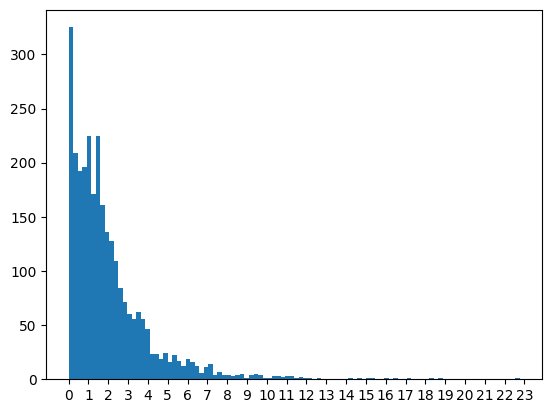

In [98]:
plt.xticks(range(0, 25, 1))
plt.hist(aa_edge_values,100)


Plot the adamic-adar values destribution for the non-existing edges.

(array([2.9903e+05, 7.5280e+03, 3.3340e+03, 1.5060e+03, 8.5800e+02,
        4.7900e+02, 3.3500e+02, 1.9200e+02, 1.2300e+02, 7.1000e+01,
        4.7000e+01, 1.9000e+01, 2.7000e+01, 2.0000e+01, 4.0000e+00,
        7.0000e+00, 0.0000e+00, 3.0000e+00, 1.0000e+00, 3.0000e+00]),
 array([0.        , 0.27128767, 0.54257534, 0.813863  , 1.08515067,
        1.35643834, 1.62772601, 1.89901368, 2.17030135, 2.44158901,
        2.71287668, 2.98416435, 3.25545202, 3.52673969, 3.79802736,
        4.06931502, 4.34060269, 4.61189036, 4.88317803, 5.1544657 ,
        5.42575336]),
 <BarContainer object of 20 artists>)

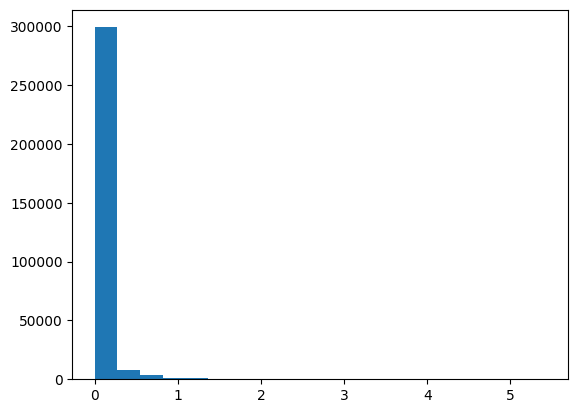

In [99]:
plt.hist(aa_non_edge_values,20)


Identify and count the non-edges in the graph with Adamic-Adar index values greater than 4.5, and display the count along with the list of edges satisfying the condition.

In [101]:
count = 0
high_aa_values = {}
for edge in G_complement.edges():
    aa_list = nx.adamic_adar_index(G, [edge])
    aa_value = list(aa_list)[0][2]
    if aa_value > 4.5:
        high_aa_values[edge] = aa_value
        count += 1
print('Adamic-Adar values > 4.5: ', count)
print('The pairs with the high adamic-adar values:', high_aa_values)

Adamic-Adar values > 4.5:  7
The pairs with the high adamic-adar values: {(336, 89): 5.425753364906164, (189, 95): 5.2666498235243715, (667, 48): 5.176877972330855, (667, 89): 4.718412597540896, (667, 442): 4.698335927054334, (48, 95): 4.782766929583283, (95, 538): 4.951472013301842}


Identify the character pairs corresponding to the edges with high Adamic-Adar index values, and display their names.

In [ ]:
dataset_names.loc[[336, 89, 189, 95, 667, 48, 667, 89, 667, 442, 48, 95, 95, 538]]

,Id,Label
336,336,Jaime Lannister
89,89,Bran Stark
189,189,Eddard Stark
95,95,Brienne of Tarth
667,667,Stannis Baratheon
48,48,Arya Stark
667,667,Stannis Baratheon
89,89,Bran Stark
667,667,Stannis Baratheon
442,442,Margaery Tyrell


Examining the pair (Brienne of Tarth, Petyr Baelish) and displaying their shared neighbors along with their respective degrees:

*The Adamic-Adar index calculates node similarity in a network based on their shared connections with other nodes, giving higher scores to nodes connected through rare or uncommon neighbors, indicating a more specific and meaningful relationship.*

Notably, Dontos Hollard is a common neighbor of the two characters with limited connections (9). According to the information from the wiki (https://awoiaf.westeros.org/index.php/Dontos_Hollard), Dontos intersects with both Petyr Baelish and Brienne in a particular storyline, suggesting a possible intersection between Brienne of Tarth and Baelish within this storyline, which never happens in the plot.

This highlights the effectiveness of the Adamic-Adar index in this dataset, as a simple metric like common neighbors may not accurately capture the interactions between characters, because many characters could simply mention or referring to the popular characters of the book. Adamic-Adar, however, can prioritize specific storylines, as shown above.

In [102]:
c_neighbors = list(nx.common_neighbors(G, 95, 538))
print('Common Neigbors')
print('Total:', len(c_neighbors))
scores = []

for cn in c_neighbors:
    degree = nx.degree(G, cn)
    print('CN:', cn, 'deg:', degree)
    
dataset_names.loc[[177]]

Common Neigbors
Total: 18
CN: 110 deg: 75
CN: 115 deg: 97
CN: 177 deg: 9
CN: 191 deg: 24
CN: 336 deg: 101
CN: 354 deg: 69
CN: 411 deg: 28
CN: 426 deg: 24
CN: 541 deg: 11
CN: 584 deg: 38
CN: 600 deg: 74
CN: 602 deg: 65
CN: 617 deg: 28
CN: 632 deg: 36
CN: 633 deg: 75
CN: 667 deg: 89
CN: 726 deg: 122
CN: 729 deg: 48


,Id,Label
177,177,Dontos Hollard


Calculate the Adamic-Adar index values for both the edges and non-edges for the barabasi-albert graph.

In [103]:
aa_non_edge_values = []
aa_edge_values = []

for edge in barabasi_albert_graph.edges():
    aa_list = nx.adamic_adar_index(barabasi_albert_graph, [edge])
    aa_value = list(aa_list)[0][2]
    aa_edge_values.append(aa_value)

for edge in barabasi_complement.edges():
    aa_list = nx.adamic_adar_index(barabasi_albert_graph, [edge])
    aa_value = list(aa_list)[0][2]
    aa_non_edge_values.append(aa_value)

print('Barabasi Graph')
print('------------------------------')
print('Edge Data:')
print('Mean:', mean(aa_edge_values))
print('SD:', std(aa_edge_values))
print('Max:', max(aa_edge_values))
print('Min:', min(aa_edge_values))
print('Non Edge Data:')
print('Mean:', mean(aa_non_edge_values))
print('SD:', std(aa_non_edge_values))
print('Max:',max(aa_non_edge_values))
print('Min:', min(aa_non_edge_values))

Barabasi Graph
------------------------------
Edge Data:
Mean: 1.5356629996860445
SD: 2.3711525353336707
Max: 44.52142906919474
Min: 0
Non Edge Data:
Mean: 0.06317246352766835
SD: 0.21012776536411906
Max: 7.935873424024718
Min: 0


Plot the adamic-adar values for the existing edges of barabasi-albert graph.

(array([1.445e+03, 3.400e+02, 2.670e+02, 2.210e+02, 1.230e+02, 1.200e+02,
        7.600e+01, 5.500e+01, 3.500e+01, 3.000e+01, 2.500e+01, 2.500e+01,
        1.200e+01, 1.200e+01, 6.000e+00, 6.000e+00, 4.000e+00, 9.000e+00,
        4.000e+00, 4.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 3.000e+00, 2.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+0

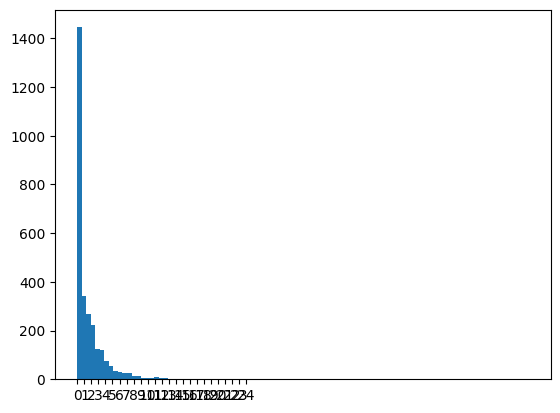

In [57]:
plt.xticks(range(0, 25, 1))
plt.hist(aa_edge_values, 100)

Plot the adamic-adar values for the non-existing edges of barabasi-albert graph.

(array([2.95392e+05, 1.03140e+04, 2.24900e+03, 9.97000e+02, 6.55000e+02,
        3.27000e+02, 1.92000e+02, 1.11000e+02, 5.60000e+01, 4.00000e+01,
        3.30000e+01, 1.00000e+01, 1.40000e+01, 8.00000e+00, 1.00000e+00,
        3.00000e+00, 3.00000e+00, 1.00000e+00, 0.00000e+00, 2.00000e+00]),
 array([0.        , 0.35737113, 0.71474225, 1.07211338, 1.42948451,
        1.78685564, 2.14422676, 2.50159789, 2.85896902, 3.21634014,
        3.57371127, 3.9310824 , 4.28845352, 4.64582465, 5.00319578,
        5.36056691, 5.71793803, 6.07530916, 6.43268029, 6.79005141,
        7.14742254]),
 <BarContainer object of 20 artists>)

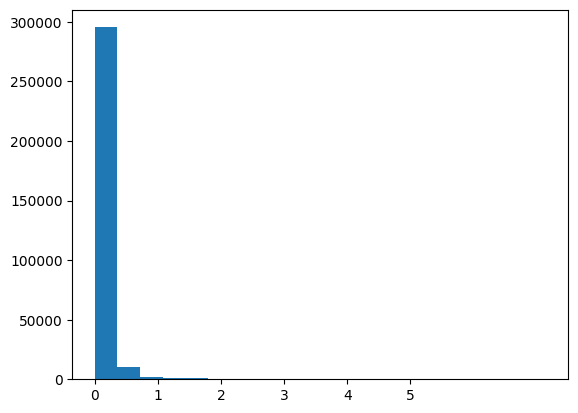

In [58]:
plt.xticks(range(0, 6, 1))
plt.hist(aa_non_edge_values, 20)

The function "get_aa_scores" calculates the Adamic-Adar scores for edges and non-edges in a given graph. It returns the Adamic-Adar scores for edges, corresponding labels indicating their presence, as well as the scores for non-edges and their labels indicating their absence.

In [104]:
def get_aa_scores(graph, graph_complement):
    edge_data = []
    edge_data_labels = []
    non_edge_data = []
    non_edge_data_labels = []

    for edge in graph_complement.edges():
        aa_list = nx.adamic_adar_index(graph, [edge])
        aa_value = list(aa_list)[0][2]
        non_edge_data.append(aa_value)
        non_edge_data_labels.append(0)

    for edge in graph.edges():
        aa_list = nx.adamic_adar_index(graph, [edge])
        aa_value = list(aa_list)[0][2]
        edge_data.append(aa_value)
        edge_data_labels.append(1)
    
    return edge_data, edge_data_labels, non_edge_data, non_edge_data_labels


The "create_dataset" function generates a balanced dataset by obtaining Adamic-Adar scores for edges and non-edges in a given graph, downsampling the non-edge results, plotting a histogram of the downsampled class, and combining the edge and non-edge data into numpy arrays.

The function yields a dataset of a single feature (adamic adar scores) and the class label of whether this score corresponds to an existing edge or not. 

In [107]:
def create_dataset(graph, graph_complement):
    
    # Obtain Adamic-Adar scores for edges and non-edges
    edge_data, edge_data_labels, non_edge_data, non_edge_data_labels = get_aa_scores(
        graph, graph_complement
    )
    
    # Downsample the majority class (non-edges) to balance the dataset
    majority_downsampled = []
    majority_downsampled_labels = []
    majority_downsampled_indices = random.sample(
        range(len(non_edge_data_labels)), len(edge_data_labels)
    )
    for i in majority_downsampled_indices:
        majority_downsampled.append(non_edge_data[i])
        majority_downsampled_labels.append(non_edge_data_labels[i])
    
    print('Plotting the downsampled non-edge aa scores')
    # Plot a histogram of the downsampled majority class
    plt.xticks(range(0, 25, 1))
    plt.hist(majority_downsampled,100)
    plt.show()
    
    # Combine the edge and downsampled majority data to create a balanced dataset
    balanced_data = edge_data + majority_downsampled
    balanced_data_labels = edge_data_labels + majority_downsampled_labels

    # Convert the data and labels into numpy arrays
    X_data = numpy.array([x for x in balanced_data]).reshape(-1, 1)
    Y_data = numpy.array([y for y in balanced_data_labels])

    return X_data, Y_data

The evaluate_with_log_regression function performs a 5-fold cross-validation evaluation using logistic regression on the given dataset, calculating and displaying accuracy, precision, recall, and confusion matrix for each fold. Finally, it presents the average accuracy, precision, and recall scores across all folds.

We use logistic regression because it is suitable for predicting the probability of a binary outcome based on input variables (adamic-adar scores) by fitting a logistic function to the data.

In [108]:
def evaluate_with_log_regression(X_data, Y_data):

    kfold = StratifiedKFold(n_splits=5, shuffle=True)

    log_regression = LogisticRegression()
    fold_idx = 1
    accuracies = []
    recalls = []
    precisions = []

    for train_index, test_index in kfold.split(X_data, Y_data):
        X_train, X_test = X_data[train_index], X_data[test_index]
        y_train, y_test = Y_data[train_index], Y_data[test_index]

        log_regression.fit(X_train, y_train)
        y_pred = log_regression.predict(X_test)
        
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        cm = confusion_matrix(y_test, y_pred)
        
        accuracies.append(accuracy)
        precisions.append(precision)
        recalls.append(recall)

        print('Fold: ', fold_idx, ', Results:')
        print('Accuracy:', accuracy)
        print('Precision:', precision)
        print('Recall:', recall)
        print(cm)
        print('------------------------------')

        fold_idx += 1
        
    print('------------------------------')
    print('Average accuracy score: ', mean(accuracies))
    print('Average precision score: ', mean(precisions))
    print('Average recall score: ', mean(recalls))

Test the algorithm on the real graph.

The results indicate good performance, with high average accuracy (0.892), precision (0.953), and recall (0.825) scores.

Plotting the downsampled non-edge aa scores


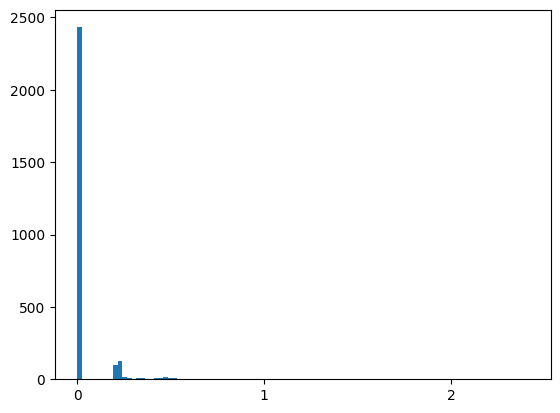

Fold:  1 , Results:
Accuracy: 0.8884955752212389
Precision: 0.9563409563409564
Recall: 0.8141592920353983
[[544  21]
 [105 460]]
------------------------------
Fold:  2 , Results:
Accuracy: 0.887511071744907
Precision: 0.9506172839506173
Recall: 0.8176991150442477
[[540  24]
 [103 462]]
------------------------------
Fold:  3 , Results:
Accuracy: 0.8848538529672276
Precision: 0.9503105590062112
Recall: 0.8123893805309734
[[540  24]
 [106 459]]
------------------------------
Fold:  4 , Results:
Accuracy: 0.899911426040744
Precision: 0.9519038076152304
Recall: 0.8421985815602837
[[541  24]
 [ 89 475]]
------------------------------
Fold:  5 , Results:
Accuracy: 0.899911426040744
Precision: 0.9537223340040242
Recall: 0.8404255319148937
[[542  23]
 [ 90 474]]
------------------------------
------------------------------
Average accuracy score:  0.8921366704029723
Average precision score:  0.9525789881834079
Average recall score:  0.8253743802171594


In [110]:
x_data, y_data = create_dataset(G, G_complement)
evaluate_with_log_regression(x_data, y_data)

Test the algorithm on the random-generated graph.

The results indicate poor performance regarding the recall metric showing a slight weakness to identify existing edges.

Plotting the downsampled non-edge aa scores


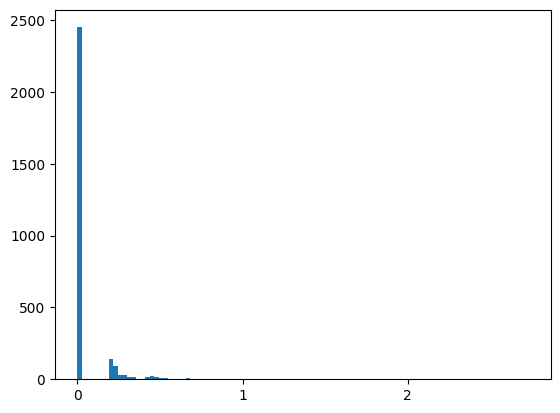

Fold:  1 , Results:
Accuracy: 0.7491379310344828
Precision: 0.883289124668435
Recall: 0.5741379310344827
[[536  44]
 [247 333]]
------------------------------
Fold:  2 , Results:
Accuracy: 0.7681034482758621
Precision: 0.9191374663072777
Recall: 0.5879310344827586
[[550  30]
 [239 341]]
------------------------------
Fold:  3 , Results:
Accuracy: 0.7603448275862069
Precision: 0.912568306010929
Recall: 0.5758620689655173
[[548  32]
 [246 334]]
------------------------------
Fold:  4 , Results:
Accuracy: 0.7732758620689655
Precision: 0.9095607235142119
Recall: 0.6068965517241379
[[545  35]
 [228 352]]
------------------------------
Fold:  5 , Results:
Accuracy: 0.7577586206896552
Precision: 0.8903394255874674
Recall: 0.5879310344827586
[[538  42]
 [239 341]]
------------------------------
------------------------------
Average accuracy score:  0.7617241379310344
Average precision score:  0.9029790092176642
Average recall score:  0.586551724137931


In [111]:
barabasi_x_data, barabasi_y_data = create_dataset(barabasi_albert_graph, barabasi_complement)
evaluate_with_log_regression(barabasi_x_data, barabasi_y_data)

Further tests and evaluations

When training the model on the scores of the real graph and testing it on the Barabasi-Albert network, it exhibited remarkable performance, indicating its ability to capture the graph characteristics and prove the similarity of the two graphs. 

However, when evaluating the model in the reverse scenario, it displayed a weakness specifically in the recall metric, suggesting potential limitations in capturing certain relationships within the Barabasi-Albert network.

In [112]:
print('Train on random graph data. Test on real data.')
lg = LogisticRegression()
lg.fit(barabasi_x_data, barabasi_y_data)
y_pred = lg.predict(x_data)

accuracy = accuracy_score(y_data, y_pred)
precision = precision_score(y_data, y_pred)
recall = recall_score(y_data, y_pred)
cm = confusion_matrix(y_data, y_pred)

print('Accuracy:', accuracy)
print('Precision:', precision)
print('Recall:', recall)
print(cm)
print('------------------------------')

print('Train on real data. Test on random data.')
lg.fit(x_data, y_data)
y_pred = lg.predict(barabasi_x_data)

accuracy = accuracy_score(barabasi_y_data, y_pred)
precision = precision_score(barabasi_y_data, y_pred)
recall = recall_score(barabasi_y_data, y_pred)
cm = confusion_matrix(barabasi_y_data, y_pred)
print('Accuracy:', accuracy)
print('Precision:', precision)
print('Recall:', recall)
print(cm)
print('------------------------------')


Train on random graph data. Test on real data.
Accuracy: 0.9008147360963514
Precision: 0.9428571428571428
Recall: 0.8533475026567482
[[2677  146]
 [ 414 2409]]
------------------------------
Train on real data. Test on random data.
Accuracy: 0.7603448275862069
Precision: 0.9265536723163842
Recall: 0.5655172413793104
[[2770  130]
 [1260 1640]]
------------------------------


## Stage 3: Simulating influence spreading on the graph by selecting k-seeds to maximize influence and defining parameters to determine the optimal number of k-seeds and the parameter values that achieve 60% network influence.

We will use Independent Cascade model for this task, which works by assuming that each node in the network can independently activate its neighboring nodes with a certain probability. 

Import the necessary libraries.

In [118]:
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep
import matplotlib.pyplot as plt
from ndlib.viz.mpl.DiffusionTrend import DiffusionTrend

To achieve the desired influence spreading of 60% in the network, we will create a subgraph that includes important key characters with a weighted-degree greater than 150.

We will analyze the weight distribution of the nodes in the subgraph to understand how the weight value, representing the number of interactions between characters, can be used as the probability of influence along the edges.

By analyzing the graph, we decide to empirically set the addition of a value=0.3 to the weight ratio in order to increase the chances of influence.

Graph with 94 nodes and 741 edges


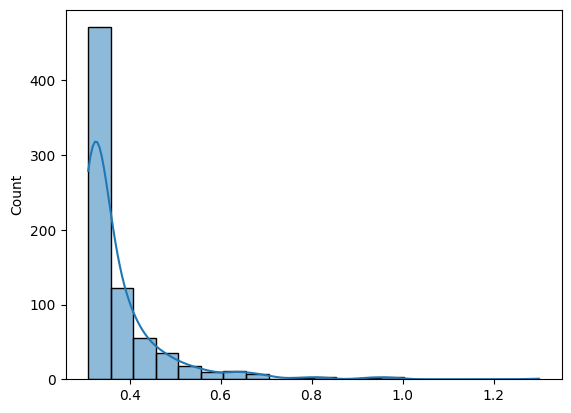

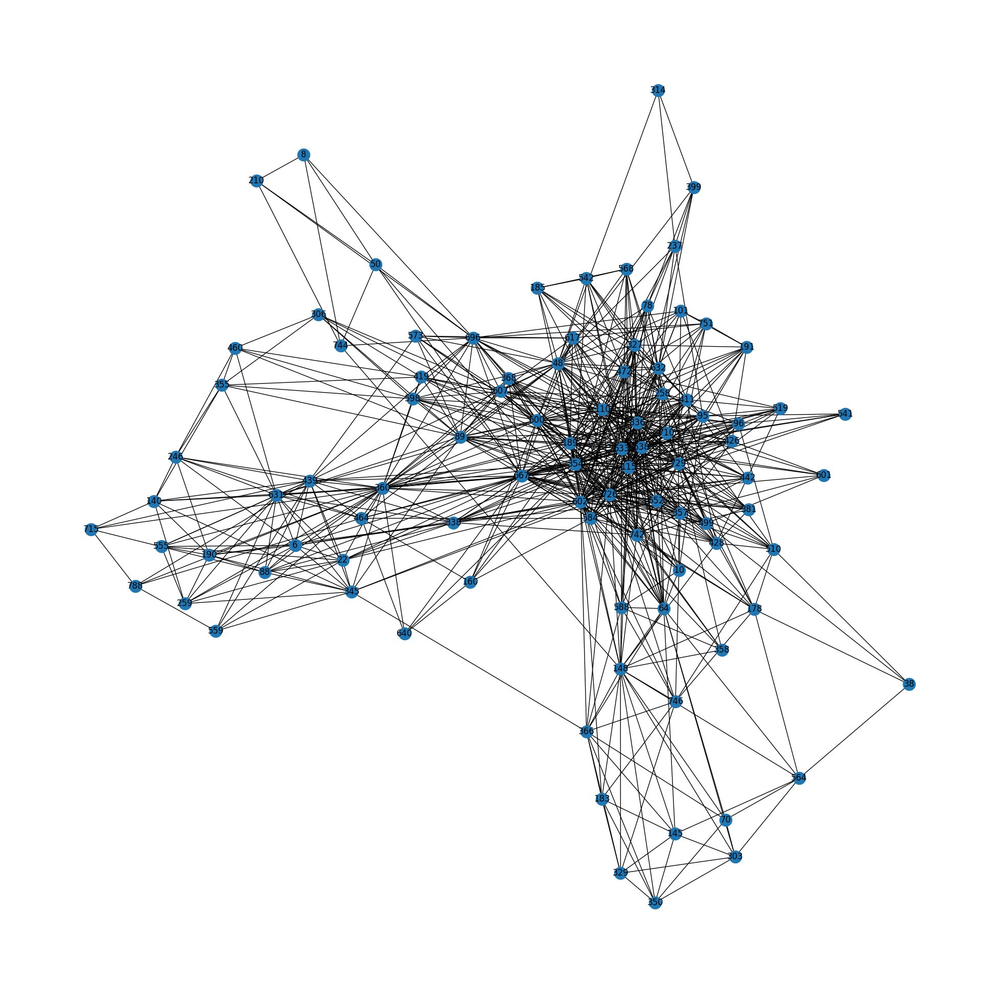

In [119]:
weighted_degrees = dict(nx.degree(G,weight='Weight'))
max_subg_w_degree = max(weighted_degrees.values())

subG = G.subgraph([n for n in weighted_degrees if weighted_degrees[n]>150])

weights = []
influence_probability = []
for _, _, weight in subG.edges(data='Weight'):
    weights.append(weight)
    
max_sub_weight = max(weights)

for _, _, weight in subG.edges(data='Weight'):
    influence_probability.append((weight / max_sub_weight) + 0.3)

        
sns.histplot(influence_probability,bins=20,kde=True)


print(subG)
plt.figure(figsize=(25,25))
spund=nx.spring_layout(subG)
plt.axis('off')
nx.draw_networkx(subG,pos=spund)
plt.show()

**Greedy search for the best k-seeds**

The function get_maximum_influence_across_iterations calculates the maximum influence achieved across multiple iterations in a given model, based on the count of nodes influenced at each iteration.

The function get_best_candidate determines the best candidate node from a set of candidates by evaluating their potential influence. It iterates through the candidates and simulates the independent cascades model with the addition of each candidate as a seed node. The function then calculates the maximum influence achieved for each candidate and returns the candidate with the highest maximum influence.

In [142]:
def get_maximum_influence_across_iterations(model):
  iterations = model.iteration_bunch(100)
  max=0
  for i in iterations:
    if i.get('node_count').get(1)>max:
      max=i.get('node_count').get(1)
  return max

def get_best_candidate(seeds, candidates):
  all_max_inf=[]
  for n in candidates:
    temp_seeds = []
    
    for x in seeds:
      temp_seeds.append(x)
    temp_seeds.append(n)

    model = ep.IndependentCascadesModel(subG)
    config = mc.Configuration()
    
    for u,v in subG.edges():
      th = ((subG.get_edge_data(u, v)['Weight']) / (max_sub_weight)) + 0.35
      config.add_edge_configuration('threshold', (u,v), th)
 
    config.add_model_initial_configuration('Infected', temp_seeds)
    
    model.set_initial_status(config) 
    max=get_maximum_influence_across_iterations(model)
    all_max_inf.append(max)
  return candidates[np.asarray(all_max_inf).argmax()] 

Determine the optimal k-seeds for the subgraph by incrementally increasing the value of k and using a selected edge probability (weight/max_weight + 0.35). In the testing cell below, we empirically find that a minimum of k=25 seeds is required to achieve a 60% network influence with the given fixed probability.

In [143]:
all_nodes=set()
for i in subG.nodes():
    all_nodes.add(i)

seeds=set()
k=25
for _ in range(k):
  candidates=list(all_nodes-seeds)
  next_best=get_best_candidate(seeds,candidates)
  seeds.add(next_best)

Print the selected seeds-characters.

In [144]:
dataset_names.loc[list(seeds)]


,Id,Label
640,640,Selyse Florent
259,259,Grenn
6,6,Aemon Targaryen (Maester Aemon)
667,667,Stannis Baratheon
542,542,Polliver
555,555,Pypar
48,48,Arya Stark
564,564,Quentyn Martell
573,573,Ramsay Snow
190,190,Eddison Tollett


We evaluate the model's performance by using the selected k-seeds and determining whether we are able to influence 60% of the network through the iterations of the model.

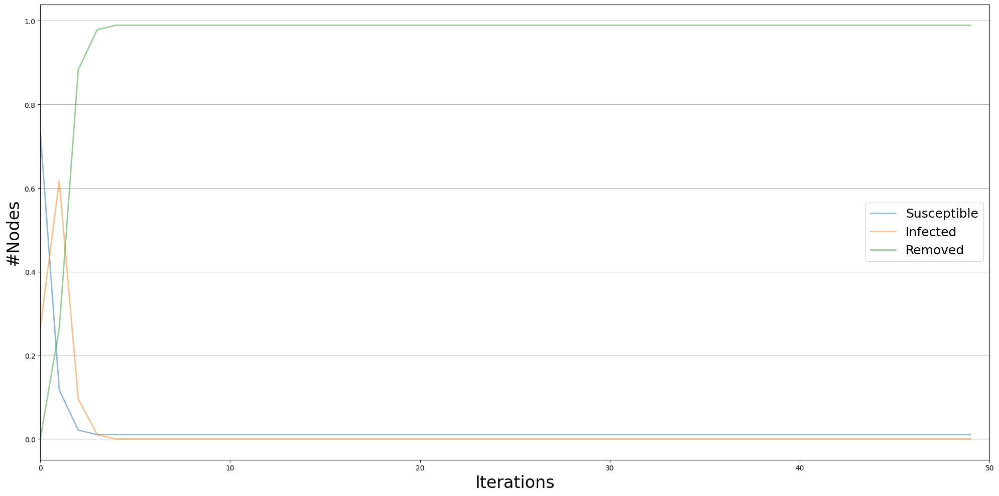

In [152]:
model = ep.IndependentCascadesModel(subG)
config = mc.Configuration()
config.add_model_initial_configuration('Infected', seeds)

for u, v in subG.edges():
    th = ((subG.get_edge_data(u, v)['Weight']) / (max_sub_weight)) + 0.35
    config.add_edge_configuration('threshold', (u, v), th)

model.set_initial_status(config)
# Simulation execution
iterations = model.iteration_bunch(50)
trends = model.build_trends(iterations)
viz = DiffusionTrend(model, trends)
viz.plot()

## Stage 4: Community Detection

In this stage, our goal is to identify and uncover the communities within the graph that correspond to specific storylines in the book series. This analysis may also help us discover the locations where these plot lines take place.

In the context of the books, certain storylines are interconnected through specific edges or key characters, serving as links between these storylines and the main plot

To identify and separate these communities, we will utilize the Girvan-Newman community detection algorithm which iteratively removes edges with high betweenness centrality in order to identify and separate communities within the network. 

In [154]:
g_copy = G.copy()

while nx.algorithms.components.number_connected_components(g_copy) < 6:
    ec = nx.algorithms.centrality.edge_betweenness_centrality(g_copy)
    max_edge = None
    max_value = None 
    for e, centrality in ec.items():
        if max_value is None or centrality > max_value: 
            max_value = centrality
            max_edge = e
    g_copy.remove_edge(*max_edge)

ccs = list(nx.connected_components(g_copy))
num_components = len(ccs)

gn_group0 = ccs[0]
gn_group1 = ccs[1]
gn_group2 = ccs[2]
gn_group3 = ccs[3]
gn_group4 = ccs[4]
gn_group5 = ccs[5]

We map the produced clusters with different colors.

In [158]:
gn_color_map = []
for v in G.nodes():
    if v in gn_group0: 
        gn_color_map.append('green')
    elif v in gn_group1: 
        gn_color_map.append('blue')
    elif v in gn_group2: 
        gn_color_map.append('yellow')
    elif v in gn_group3: 
        gn_color_map.append('cyan')
    elif v in gn_group4: 
        gn_color_map.append('red')
    else: 
        gn_color_map.append('pink')

We plot the network showing the produced clusters.

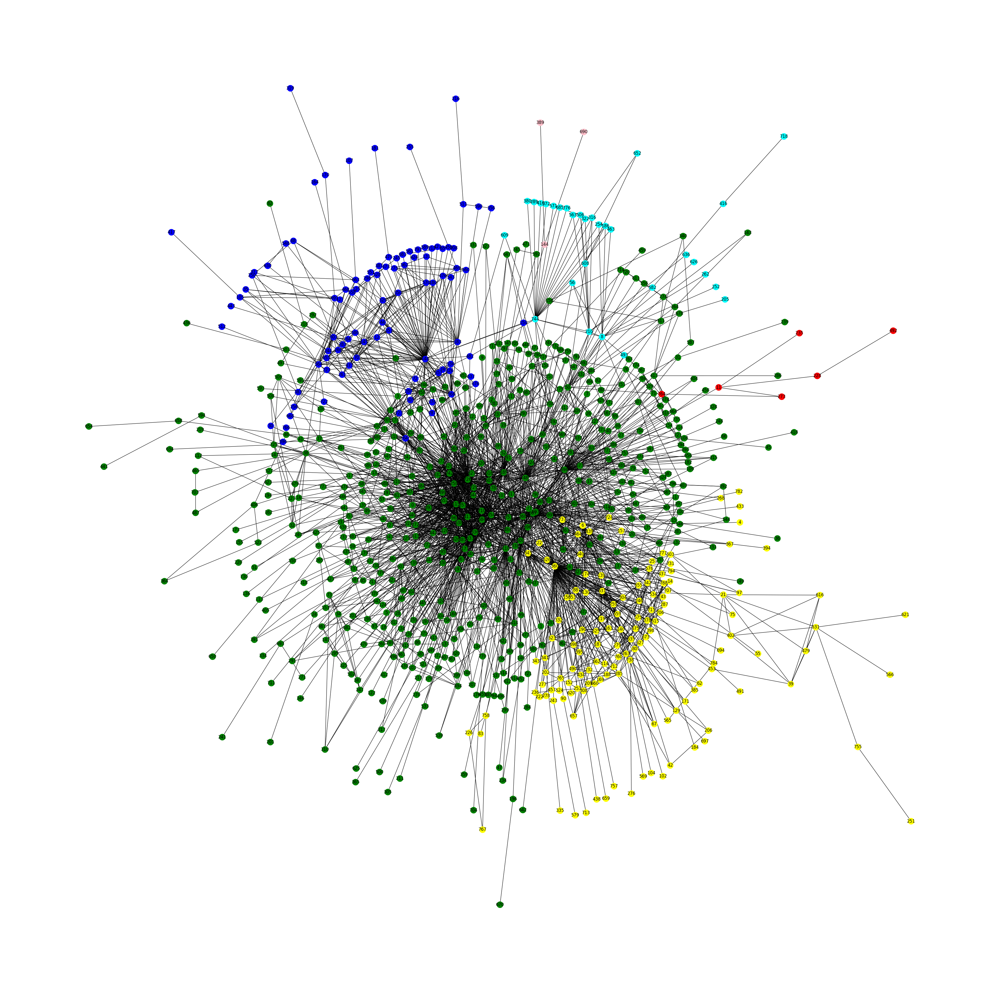

In [159]:
plt.figure(figsize=(50,50))
spund=nx.kamada_kawai_layout(G)
plt.axis('off')
nx.draw_networkx(G,pos=spund,node_color=gn_color_map)
plt.show()


Print the key protagonist node for each community.

In [170]:
max_degree = 0
max_node = {}
for node in gn_group0:
    curr_degree  = nx.degree(G, node, weight='Weight')
    if curr_degree > max_degree:
        max_degree = curr_degree
        max_node = node
    
print('(Green) Protagonist: ', dataset_names.loc[max_node]['Label'])


max_degree = 0
max_node = {}
for node in gn_group1:
    curr_degree  = nx.degree(G, node, weight='Weight')
    if curr_degree > max_degree:
        max_degree = curr_degree
        max_node = node
        
print('(Blue) Protagonist: ', dataset_names.loc[max_node]['Label'])

max_degree = 0
max_node = {}
for node in gn_group2:
    curr_degree  = nx.degree(G, node, weight='Weight')
    if curr_degree > max_degree:
        max_degree = curr_degree
        max_node = node
    
print('(Yellow) Protagonist: ', dataset_names.loc[max_node]['Label'])

max_degree = 0
max_node = {}
for node in gn_group3:
    curr_degree  = nx.degree(G, node, weight='Weight')
    if curr_degree > max_degree:
        max_degree = curr_degree
        max_node = node

print('(Cyan) Protagonist: ', dataset_names.loc[max_node]['Label'])

max_degree = 0
max_node = {}
for node in gn_group4:
    curr_degree  = nx.degree(G, node, weight='Weight')
    if curr_degree > max_degree:
        max_degree = curr_degree
        max_node = node

print('(Red) Protagonist: ', dataset_names.loc[max_node]['Label'])

max_degree = 0
max_node = {}
for node in gn_group5:
    curr_degree  = nx.degree(G, node, weight='Weight')
    if curr_degree > max_degree:
        max_degree = curr_degree
        max_node = node

print('(Pink) Protagonist: ', dataset_names.loc[max_node]['Label'])


(Green) Protagonist:  Tyrion Lannister
(Blue) Protagonist:  Daenerys Targaryen
(Yellow) Protagonist:  Jon Snow
(Cyan) Protagonist:  Victarion Greyjoy
(Red) Protagonist:  Wex Pyke
(Pink) Protagonist:  Cutjack
